In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

In [5]:
df = pd.read_csv("/home/tileng/Documents/GitHub/uncertain-world-gen/scripting/data/results3feat_2worlds_0.3endA_2-clases_0.9-correlation.csv")
df

,Features,World,errRange,n_samples,skl,post_hoc,uncertain_forest,random_forest,logistic_regression,majority
0,3,1,0.0,5,0.9100,0.9100,0.9101,0.8635,0.8573,0.5379
1,3,1,0.0,5,0.9963,0.9963,0.9963,0.9841,0.8973,0.5379
2,3,1,0.0,5,0.9495,0.9495,0.9495,0.9056,0.9490,0.5379
3,3,1,0.0,5,0.9957,0.9957,0.9957,0.9733,0.8990,0.5379
4,3,1,0.0,5,0.8563,0.8563,0.8563,0.8032,0.8137,0.5379
...,...,...,...,...,...,...,...,...,...,...
2899,3,1,1.0,40,0.6392,0.7915,0.7837,0.5717,0.8831,0.5379
2900,3,1,1.0,40,0.2592,0.5612,0.4109,0.1885,0.9344,0.5379
2901,3,1,1.0,40,0.3994,0.5843,0.7258,0.4509,0.8265,0.5379
2902,3,1,1.0,40,0.4256,0.7575,0.7164,0.5877,0.9156,0.5379


In [9]:
results = ["skl", "post_hoc", "uncertain_forest", "random_forest", "majority"]#, "lasso", "ridge"]

agg_r = {}

for learner in results:
    agg_r[learner] = [np.mean]

In [10]:
df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()

/tmp/ipykernel_14556/389143491.py:1: FutureWarning: The provided callable <function mean at 0x7aa098127880> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()


,Features,World,n_samples,skl,post_hoc,uncertain_forest,random_forest,majority
,,,,mean,mean,mean,mean,mean
0,3,0,5,0.598152,0.595357,0.578874,0.544820,0.7779
1,3,0,10,0.605366,0.626536,0.608972,0.554382,0.7779
2,3,0,20,0.615168,0.651736,0.656363,0.594082,0.7779
3,3,0,40,0.615743,0.668546,0.674247,0.601944,0.7779
4,3,1,5,0.744425,0.772712,0.768875,0.711210,0.5379
5,3,1,10,0.710302,0.757563,0.792696,0.725572,0.5379
6,3,1,20,0.737766,0.813553,0.846387,0.765467,0.5379
7,3,1,40,0.717017,0.810346,0.849609,0.757947,0.5379


In [13]:
# df = pd.read_csv("results2feat_50worlds_0.1endA.csv")

new = df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()
new = new[new["n_samples"] == 40].reset_index()
new[["skl", "post_hoc", "uncertain_forest", "random_forest"]].mean(axis=1).sort_values()
# new.groupby(["Features", "World", "n_samples", "errRange"]).agg(agg_r).reset_index()
# new

/tmp/ipykernel_14556/2829978486.py:3: FutureWarning: The provided callable <function mean at 0x7aa098127880> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  new = df.groupby(["Features", "World", "n_samples"]).agg(agg_r).reset_index()


0    0.64012
1    0.78373
dtype: float64

### OLD

/tmp/ipykernel_192749/3982510059.py:13: FutureWarning: The provided callable <function mean at 0x7412c1fe2ca0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()
/tmp/ipykernel_192749/3982510059.py:13: FutureWarning: The provided callable <function std at 0x7412c1fe2de0> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()


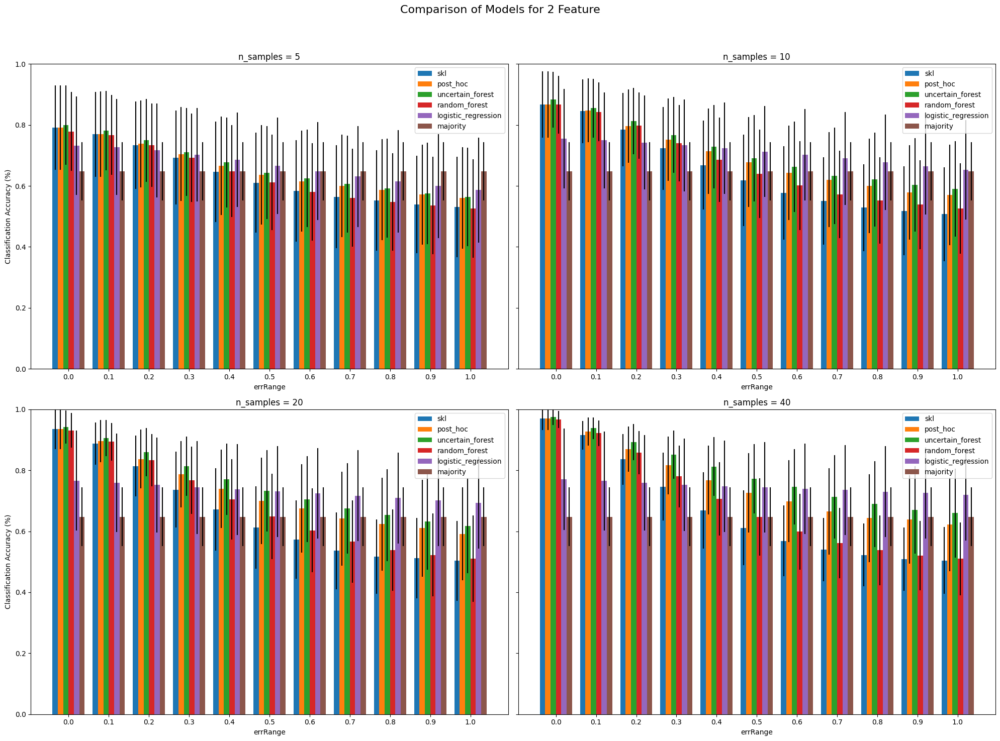

In [15]:
feature = 2
endA = 0.1
clases = 2
results = ["skl", "post_hoc", "uncertain_forest", "random_forest","logistic_regression", "majority"] #["skl", "post_hoc", "uncertain_forest", "random_forest", "lasso", "ridge"]
# results = ["skl", "random_forest"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean, np.std] for learner in results}

# Load and process the data
df = pd.read_csv("without_missing_class2feat_25worlds_0.3endA_2-clases.csv")
# df = df[df["World"] == 22].reset_index()
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Filter data for the specified feature
feature_data = df[df['Features'] == feature]

# Create a figure with 4 subplots in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
fig.suptitle(f'Comparison of Models for {feature} Feature', fontsize=16)

# Flatten axes array to easily iterate over it
axes = axes.flatten()

# Iterate over each sample size and plot
for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = feature_data[feature_data['n_samples'] == samples]

    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Calculate the positions for the bars dynamically
    bar_width = 0.8 / len(results)  # Adjust bar width based on the number of results
    bar_positions = [np.arange(len(x)) + j * bar_width for j in range(len(results))]

    # Plot each learner's results dynamically
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')]
        stds = samples_data[(learner, 'std')]
        axes[i].bar(bar_positions[j], means, yerr=stds, width=bar_width, label=learner)
    

    axes[i].set_xlabel('errRange')
    axes[i].set_title(f'n_samples = {samples}')
    axes[i].set_xticks(bar_positions[0] + (len(results) - 1) * bar_width / 2)
    axes[i].set_xticklabels(x)
    axes[i].set_ylim([0, 1])
    axes[i].legend()

# Set the label for the y-axis on the first plot
axes[0].set_ylabel('Classification Accuracy (%)')
axes[2].set_ylabel('Classification Accuracy (%)')

# Adjust layout to prevent overlapping
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()

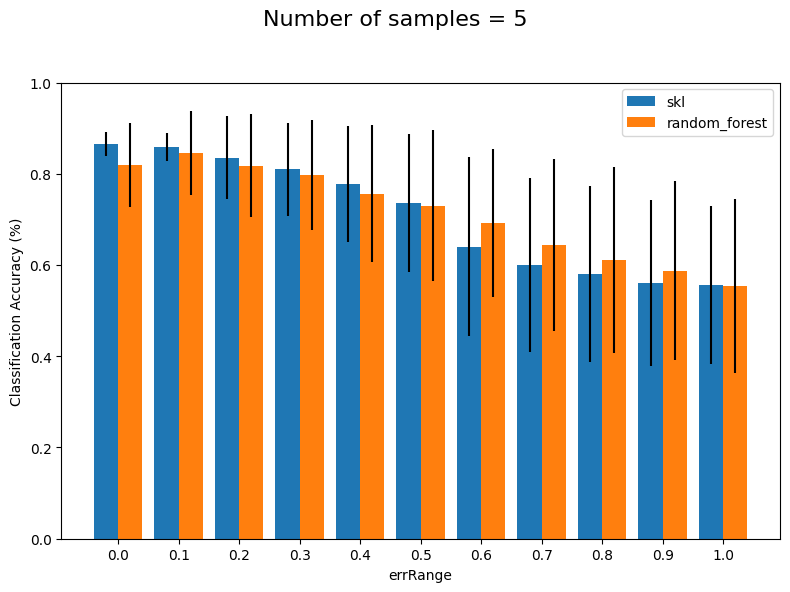

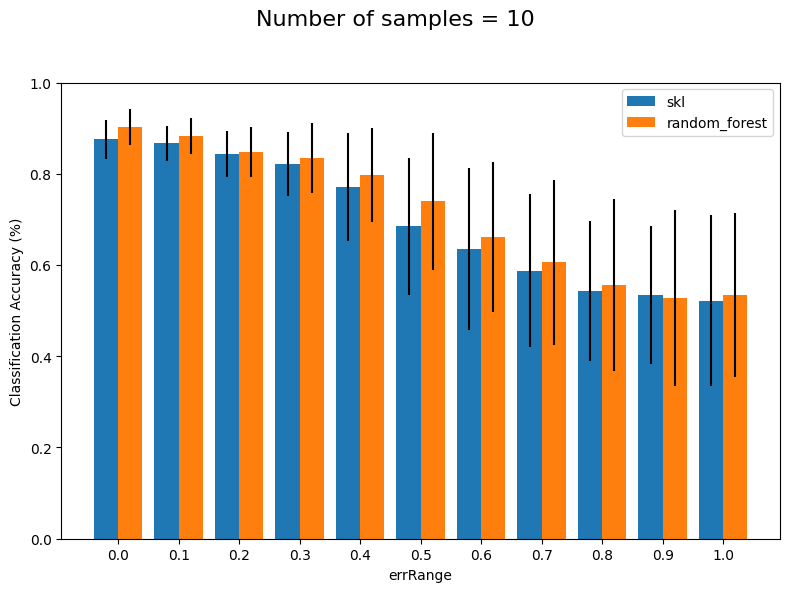

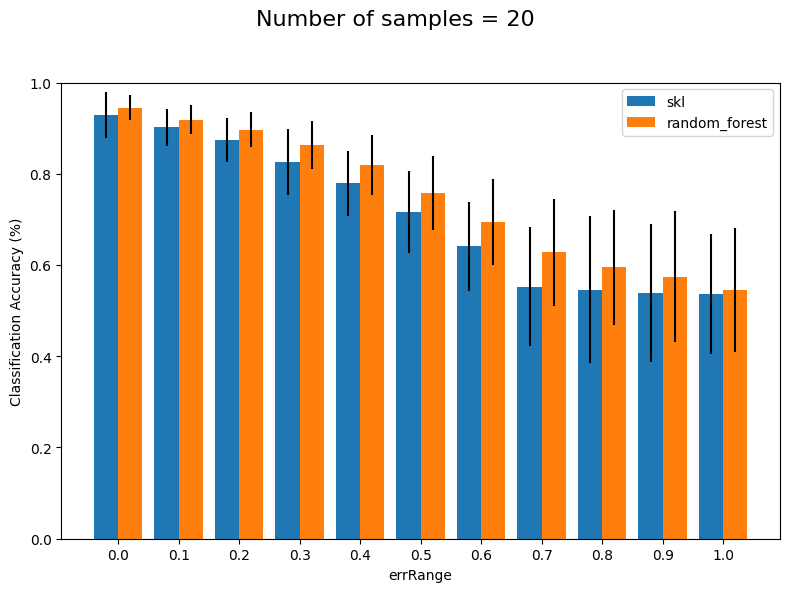

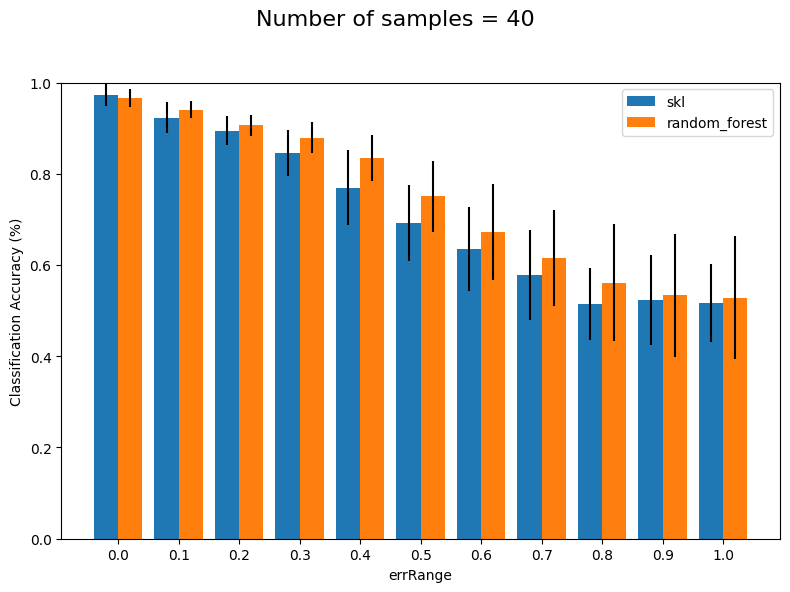

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set parameters
feature = 2
endA = 0.1
clases = 2
results = ["skl", "random_forest"]
# results = ["skl", "post_hoc", "uncertain_forest", "random_forest"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean, np.std] for learner in results}

# Load and process the data
df = pd.read_csv("sasha world2feat_1worlds_0.3endA_2-clases.csv")
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Filter data for the specified feature
feature_data = df[df['Features'] == feature]

# Iterate over each sample size and plot in a separate figure
for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = feature_data[feature_data['n_samples'] == samples]

    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Calculate the positions for the bars dynamically
    bar_width = 0.8 / len(results)  # Adjust bar width based on the number of results
    bar_positions = [np.arange(len(x)) + j * bar_width for j in range(len(results))]

    # Create a new figure for each sample size
    fig, ax = plt.subplots(figsize=(8, 6))
    fig.suptitle(f'Number of samples = {samples}', fontsize=16)

    # Plot each learner's results dynamically
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')]
        stds = samples_data[(learner, 'std')]
        ax.bar(bar_positions[j], means, yerr=stds, width=bar_width, label=learner)
    
    # Customize the subplot
    ax.set_xlabel('errRange')
    ax.set_ylabel('Classification Accuracy (%)')
    ax.set_xticks(bar_positions[0] + (len(results) - 1) * bar_width / 2)
    ax.set_xticklabels(x)
    ax.set_ylim([0, 1])
    ax.legend()

    # Adjust layout and show the plot
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"worlds/{81}/samples_{samples}/comparison.jpg")

### New

/tmp/ipykernel_14556/870508103.py:14: FutureWarning: The provided callable <function mean at 0x7aa098127880> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()
/tmp/ipykernel_14556/870508103.py:14: FutureWarning: The provided callable <function std at 0x7aa0981279c0> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()


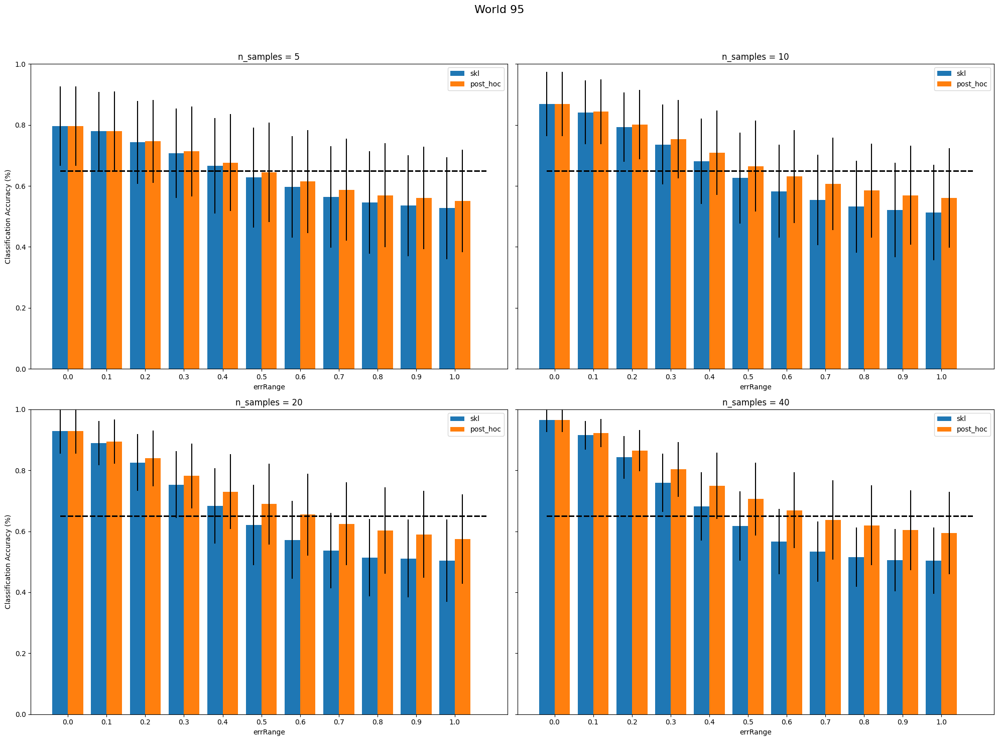

In [20]:
feature = 2
corr = 0.8
endA = 0.3
clases = 2
results = ["skl", "post_hoc"
            #, "uncertain_forest", "random_forest"#, "logistic_regression"
        , "majority"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean, np.std] for learner in results}

# Load and process the data
df = pd.read_csv(f"data/results{feature}feat_50worlds_{endA}endA_{clases}-clases_{corr}-correlation.csv")
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Filter data for the specified feature
feature_data = df[df['Features'] == feature]

# Create a figure with 4 subplots in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
# fig.suptitle(f'Comparison of Models for {feature} Feature {clases}', fontsize=16)
fig.suptitle(f'World 95', fontsize=16)

# Flatten axes array to easily iterate over it
axes = axes.flatten()

# Iterate over each sample size and plot
for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = feature_data[feature_data['n_samples'] == samples]

    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Exclude 'majority' from bar calculations
    bar_learners = [learner for learner in results if learner != 'majority']
    bar_width = 0.8 / len(bar_learners)  # Adjust bar width based on the number of bar learners
    bar_positions = [np.arange(len(x)) + j * bar_width for j in range(len(bar_learners))]

    # Plot each learner's results dynamically
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')]
        stds = samples_data[(learner, 'std')]

        if learner == 'majority':
            majority_means = means
            majority_stds = stds
            continue
            # Plot 'majority' as a line
        else:
            # For 'logistic_regression', make the bars more transparent
            if learner == 'logistic_regression':
                alpha_value = 0.4  # Set transparency
            else:
                alpha_value = 1.0

            axes[i].bar(bar_positions[j], means, yerr=stds, width=bar_width, label=learner, alpha=alpha_value)

    axes[i].hlines(y = majority_means, xmin = 0, xmax= len(x), colors='k', linestyles='--', lw=2)
    
    
    axes[i].set_xlabel('errRange')
    axes[i].set_title(f'n_samples = {samples}')
    axes[i].set_xticks(np.arange(len(x)) + (len(bar_learners) - 1) * bar_width / 2)
    axes[i].set_xticklabels(x)
    axes[i].set_ylim([0, 1])
    axes[i].legend()

# Set the label for the y-axis on the first plotS
axes[0].set_ylabel('Classification Accuracy (%)')
axes[2].set_ylabel('Classification Accuracy (%)')

# Adjust layout to prevent overlapping
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()


/tmp/ipykernel_14556/648733679.py:11: FutureWarning: The provided callable <function mean at 0x7aa098127880> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()


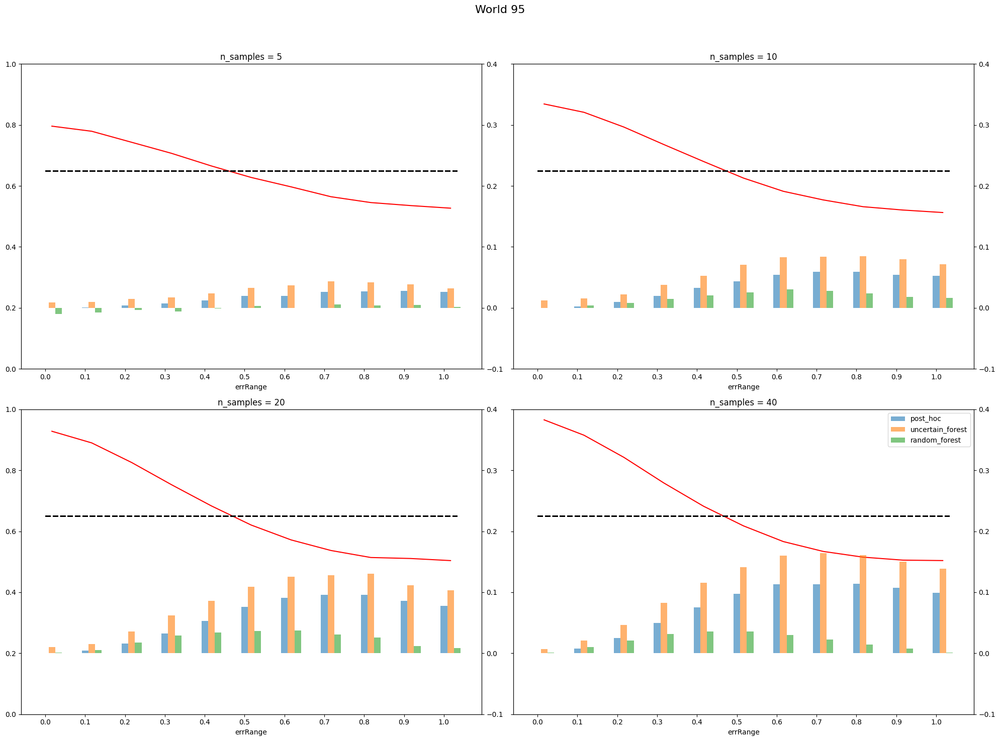

In [29]:
results = ["skl", "post_hoc"
           , "uncertain_forest", "random_forest"#, "logistic_regression"
        , "majority"]

# Define aggregation dictionary dynamically based on the selected results
agg_r = {learner: [np.mean] for learner in results}

# Load and process the data
df = pd.read_csv(f"tested_world95.csv")
df = pd.read_csv(f"data/results{2}feat_50worlds_{0.3}endA_{2}-clases_{0.9}-correlation.csv")
df = df.groupby(["Features", "errRange", "n_samples"]).agg(agg_r).reset_index()

# Create a figure with 4 subplots in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(20, 15), sharey=True)
# fig.suptitle(f'Comparison of Models for {feature} Feature {clases}', fontsize=16)
fig.suptitle(f'World 95', fontsize=16)

# Flatten axes array to easily iterate over it
axes = axes.flatten()

for i, samples in enumerate(np.unique(df["n_samples"])):
    samples_data = df[df['n_samples'] == samples]
    
    # Prepare data for plotting
    x = samples_data['errRange']
    
    # Exclude 'majority' from bar calculations
    bar_learners = [learner for learner in results if learner != 'majority' and  learner != 'skl']
    bar_width = 0.05 / len(bar_learners)  # Adjust bar width based on the number of bar learners
    bar_positions = {}
    for j, learner in enumerate(bar_learners):
        bar_positions[learner] = (x + j * bar_width)
    
    axes[i].plot([np.array(list(bar_positions.values()))[:,j].mean() for j in range(len(x))], samples_data['skl'], color='red')
    ax2 = axes[i].twinx()
    
    
    for j, learner in enumerate(results):
        means = samples_data[(learner, 'mean')] - samples_data[('skl', 'mean')]

        if learner == 'majority':
            majority_means = samples_data[(learner, 'mean')]
            continue
            # Plot 'majority' as a line
        elif learner == 'skl':
            continue
        
        ax2.bar(bar_positions[learner], means, yerr=0, width=bar_width, label=learner, alpha=0.6)
            
    axes[i].hlines(y = majority_means, xmin = 0, xmax= np.max(list(bar_positions.values())), colors='k', linestyles='--', lw=2)
    plt.xticks(x)
    axes[i].set_xlabel('errRange')
    axes[i].set_title(f'n_samples = {samples}')
    axes[i].set_ylim([0, 1])
    ax2.set_ylim([-0.1, 0.4])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
plt.legend()
plt.show()


In [ ]:
bar_width = 0.1 / len(bar_learners)  # Adjust bar width based on the number of bar learners
bar_positions = {}
for j, learner in enumerate(bar_learners):
    bar_positions[learner] = (x + j * bar_width)

In [116]:
bar_positions

{'post_hoc': 3     0.0
 7     0.1
 11    0.2
 15    0.3
 19    0.4
 23    0.5
 27    0.6
 31    0.7
 35    0.8
 39    0.9
 43    1.0
 Name: errRange, dtype: float64,
 'uncertain_forest': 3     0.025
 7     0.125
 11    0.225
 15    0.325
 19    0.425
 23    0.525
 27    0.625
 31    0.725
 35    0.825
 39    0.925
 43    1.025
 Name: errRange, dtype: float64,
 'random_forest': 3     0.05
 7     0.15
 11    0.25
 15    0.35
 19    0.45
 23    0.55
 27    0.65
 31    0.75
 35    0.85
 39    0.95
 43    1.05
 Name: errRange, dtype: float64,
 'logistic_regression': 3     0.075
 7     0.175
 11    0.275
 15    0.375
 19    0.475
 23    0.575
 27    0.675
 31    0.775
 35    0.875
 39    0.975
 43    1.075
 Name: errRange, dtype: float64}

In [11]:
from ploting import draw_world_from_seed

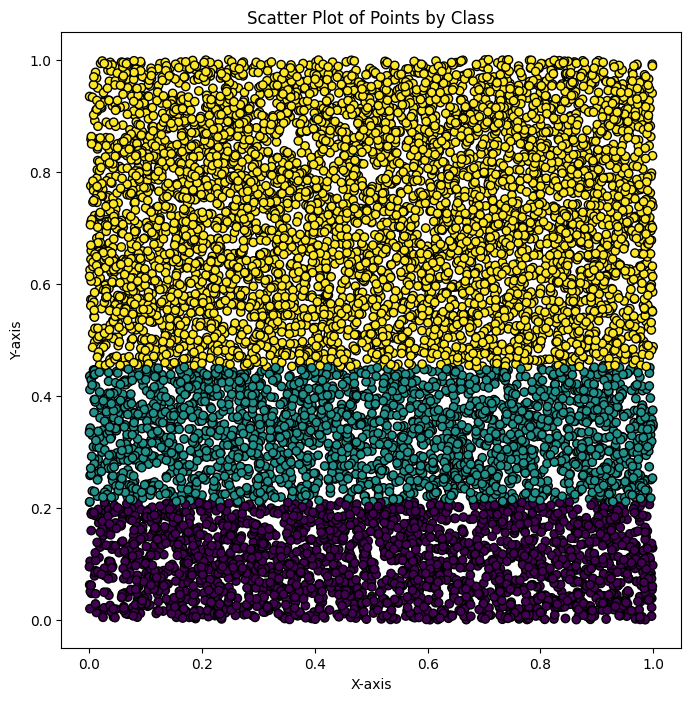

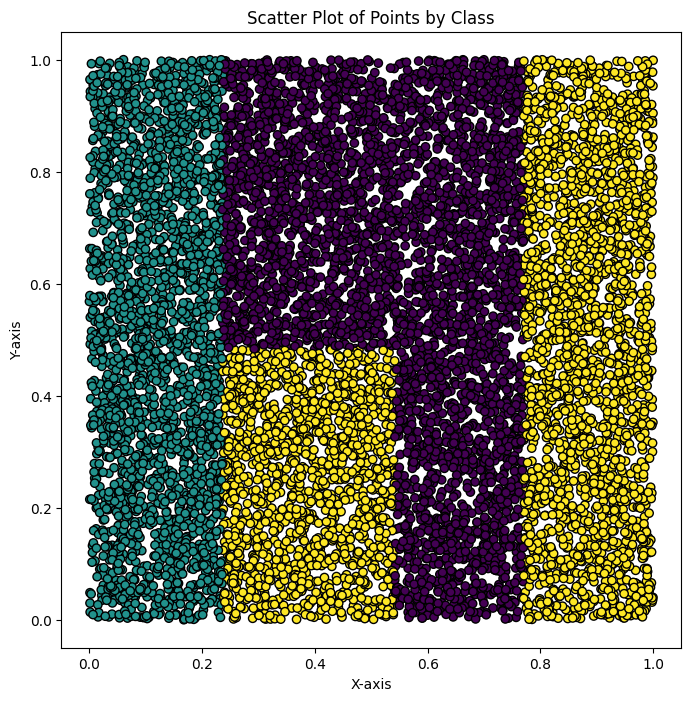

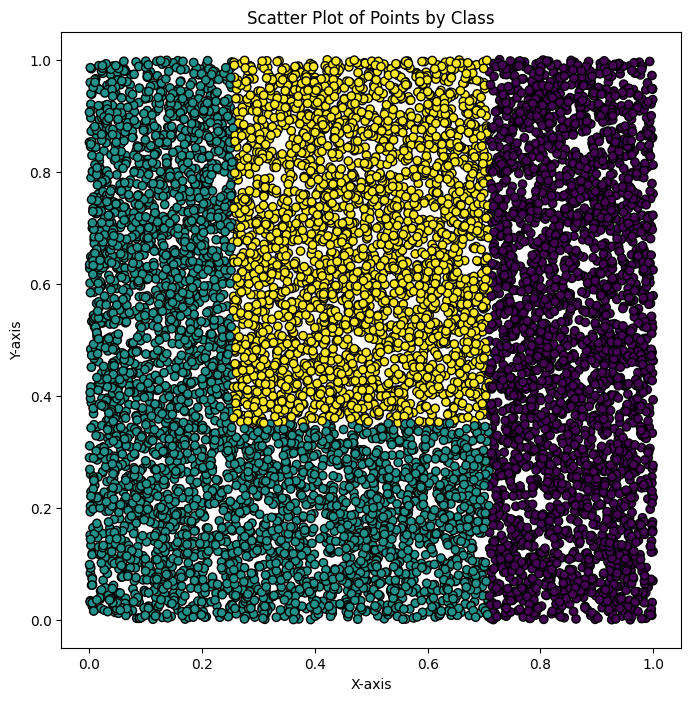

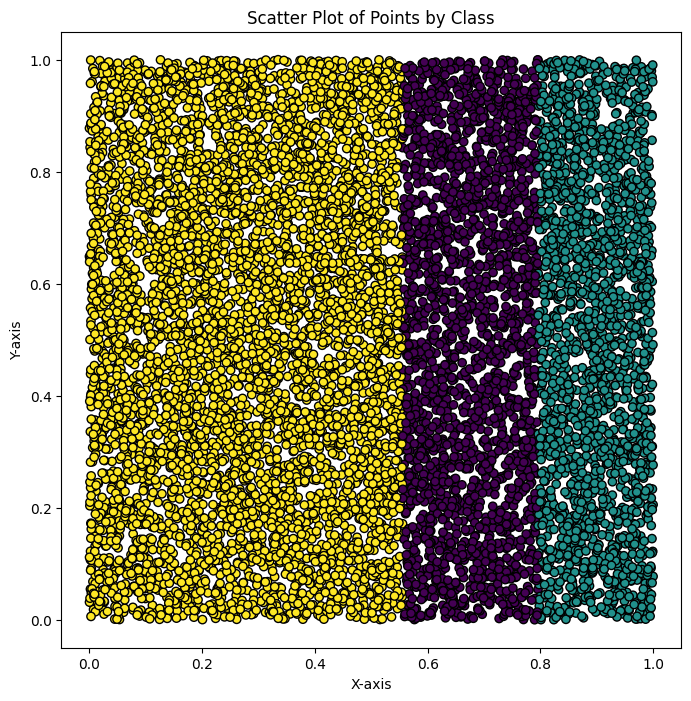

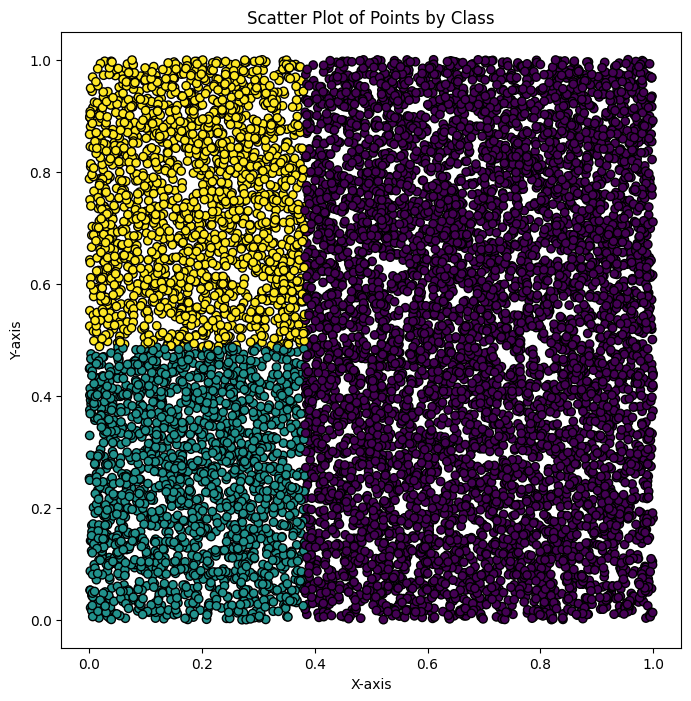

...

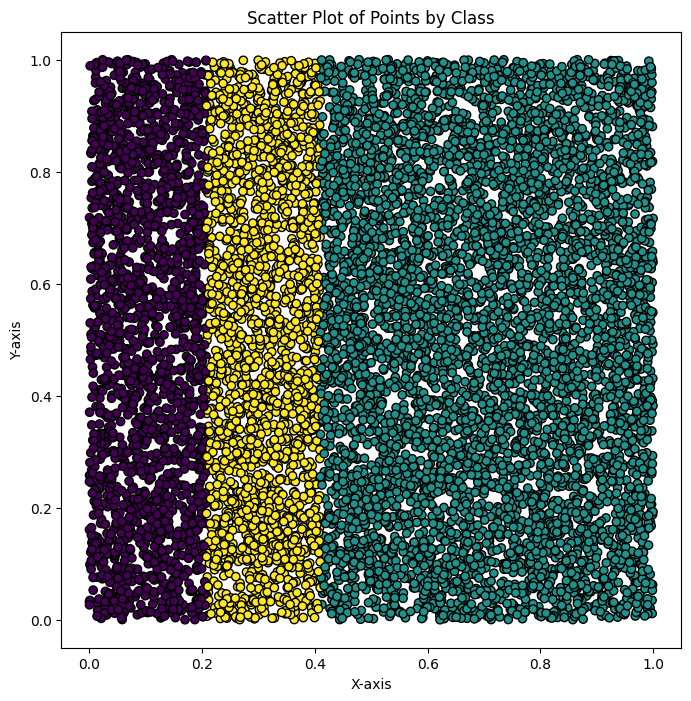

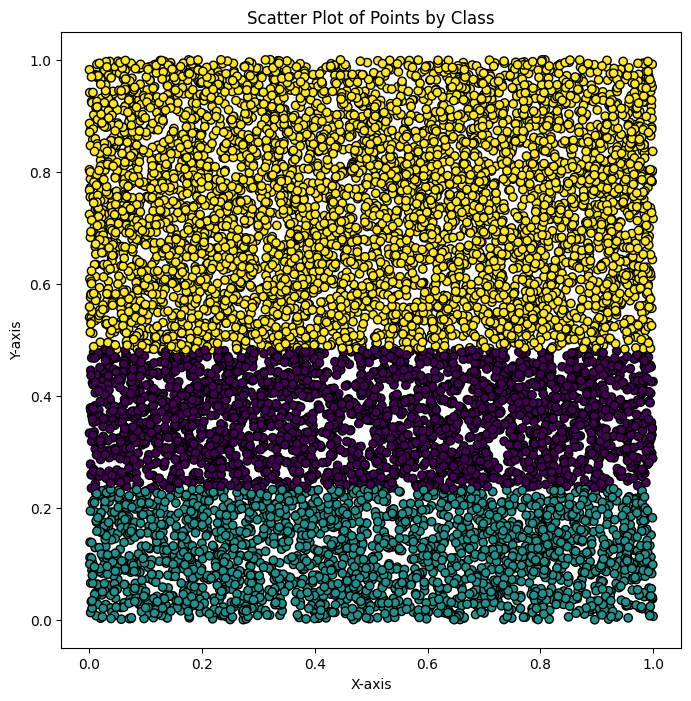

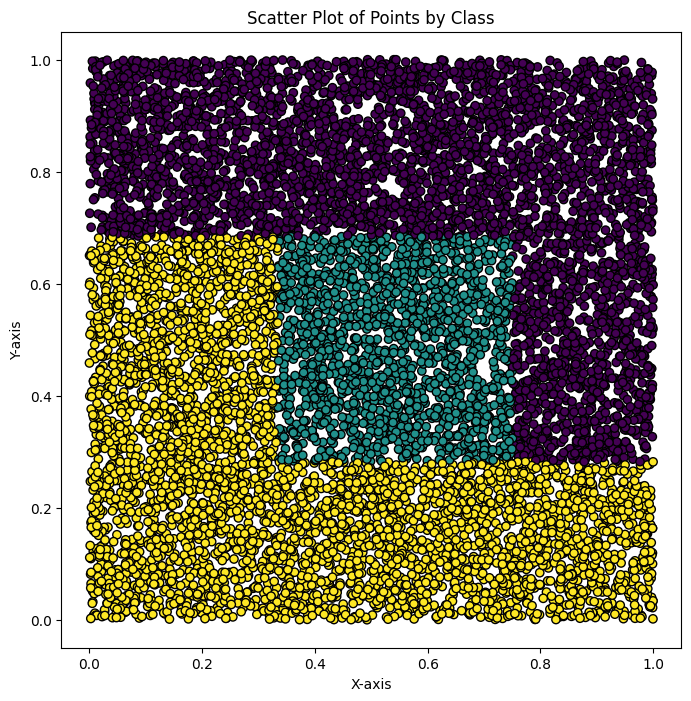

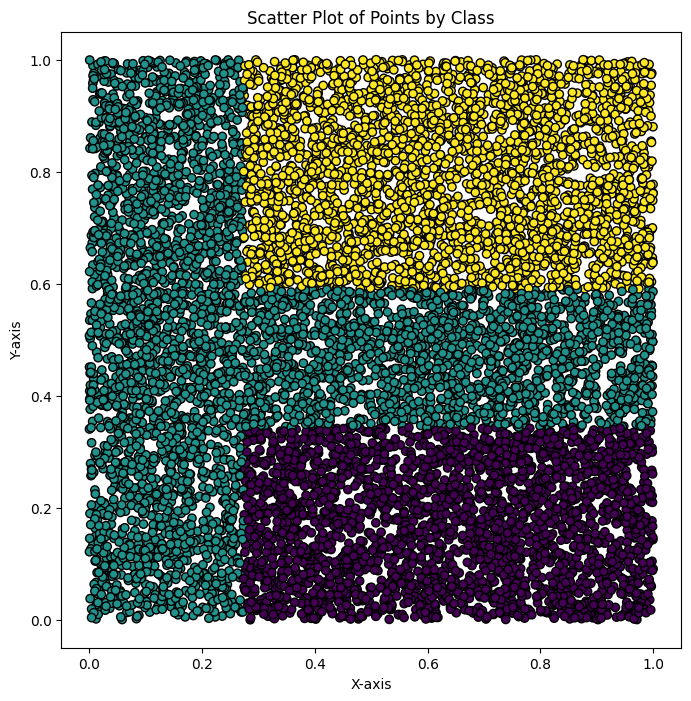

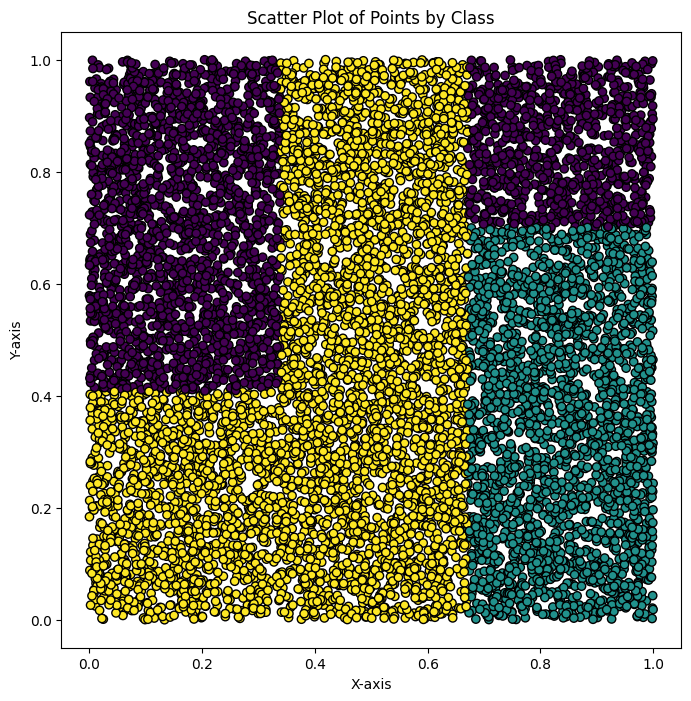

In [12]:
# for seed in [43, 34, 17, 13, 22]:#[17, 22, 34, 26, 27]
#     endA = 0.3 
# for seed in [34, 35, 18, 2, 47]:
#     endA = 0.2 
for seed in range(20): 
    endA = 0.3
    draw_world_from_seed(seed, features = 2, NUMBER_OF_CLASSES = 3, endT = .2, endA = endA, max_depth = 4)